# Integration of all dataset

In [1]:
#loading packages
library(Seurat)
library(ggplot2)
library(magrittr)
library(data.table)
library(Matrix)
library(dplyr)
library(tibble)
library(harmony) #for integration


Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: Rcpp



In [2]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRblas.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRlapack.dylib

locale:
[1] ja_JP.UTF-8/ja_JP.UTF-8/ja_JP.UTF-8/C/ja_JP.UTF-8/ja_JP.UTF-8

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] harmony_0.1.0     Rcpp_1.0.7        tibble_3.0.5      dplyr_1.0.3      
[5] Matrix_1.3-2      data.table_1.13.6 magrittr_2.0.1    ggplot2_3.3.3    
[9] Seurat_3.2.3     

loaded via a namespace (and not attached):
 [1] nlme_3.1-151          matrixStats_0.57.0    RcppAnnoy_0.0.18     
 [4] RColorBrewer_1.1-2    httr_1.4.2            repr_1.1.0           
 [7] sctransform_0.3.2     tools_4.0.3           R6_2.5.1             
[10] irlba_2.3.3           rpart_4.1-15          KernSmooth_2.23-18

## Preprocessing

### loading dataset

In [3]:
# loading data of each dataset
seu.cap <- readRDS(file = '../../data/seurat_object/Set3/seu_HQC_subclusterd2_Set3.obj')
seu.cap
seu.tryp <- readRDS(file = '../../data/seurat_object/Set2/seu_HQC_subclusterd2_Set2.obj')
seu.tryp
seu.ht <- readRDS(file = '../../data/seurat_object/Set1/seu_HQC_subclusterd2_Set1.obj')
seu.ht
seu.nk <- readRDS(file = '../../data/seurat_object/NK-data/seu_HQC_subclusterd2_NK.obj')
seu.nk

An object of class Seurat 
28745 features across 6118 samples within 2 assays 
Active assay: SCT (11239 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, reumap

An object of class Seurat 
28355 features across 4855 samples within 2 assays 
Active assay: SCT (10851 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, reumap

An object of class Seurat 
28877 features across 1018 samples within 2 assays 
Active assay: SCT (11281 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

An object of class Seurat 
24124 features across 1476 samples within 2 assays 
Active assay: SCT (10003 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, reumap

In [4]:
# Sort gene names by the same rule.
SortGeneName <- function(seu){
    gene.names <- rownames(seu)
    sorted.gene.names <- sort(gene.names)
    seu.sorted <- seu[sorted.gene.names,]
    return(seu.sorted)
}
seu.cap <- SortGeneName(seu.cap)
seu.tryp <- SortGeneName(seu.tryp)
seu.ht <- SortGeneName(seu.ht)
seu.nk <- SortGeneName(seu.nk)

### Normalize each dataset

In [5]:
DefaultAssay(seu.cap) <- 'RNA'
seu.cap <- suppressWarnings(SCTransform(seu.cap, vars.to.regress = c('percent.mt','percent.rRNA')))

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 11239 by 6118

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 6118 cells



  |======================================================================| 100%


Found 162 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 11239 genes



  |======================================================================| 100%


Computing corrected count matrix for 11239 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 1.076918 mins

Determine variable features

Set 3000 variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, percent.rRNA

Centering data matrix

Set default assay to SCT



In [6]:
DefaultAssay(seu.tryp) <- 'RNA'
seu.tryp <- suppressWarnings(SCTransform(seu.tryp, vars.to.regress = c('percent.mt','percent.rRNA')))

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 10851 by 4855

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 4855 cells



  |======================================================================| 100%


Found 159 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 10851 genes



  |======================================================================| 100%


Computing corrected count matrix for 10851 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 51.1155 secs

Determine variable features

Set 3000 variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, percent.rRNA

Centering data matrix

Set default assay to SCT



In [7]:
DefaultAssay(seu.nk) <- 'RNA'
seu.nk <- suppressWarnings(SCTransform(seu.nk, vars.to.regress = c('percent.mt','percent.rRNA')))

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 10003 by 1476

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 1476 cells



  |======================================================================| 100%


Found 74 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 10003 genes



  |======================================================================| 100%


Computing corrected count matrix for 10003 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 16.76597 secs

Determine variable features

Set 3000 variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, percent.rRNA

Centering data matrix

Set default assay to SCT



In [8]:
DefaultAssay(seu.ht) <- 'RNA'
seu.ht <- suppressWarnings(SCTransform(seu.ht, vars.to.regress = c('percent.mt','percent.rRNA','percent.ERCC')))

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 11281 by 1018

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 1018 cells



  |======================================================================| 100%


Second step: Get residuals using fitted parameters for 11281 genes



  |======================================================================| 100%


Computing corrected count matrix for 11281 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 7.232315 secs

Determine variable features

Set 3000 variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, percent.rRNA, percent.ERCC

Centering data matrix

Set default assay to SCT



## Integraion

### feature selection

In [9]:
#add dataset info
seu.cap$set <- 'Set 3'
seu.tryp$set <- 'Set 2'
seu.ht$set <- 'Set 1'
seu.nk$set <- 'NK-data'

In [10]:
#feature selection
integration.features <- SelectIntegrationFeatures(object.list = c(seu.cap, seu.tryp, seu.nk, seu.ht), nfeatures = 3000)

### Naive merge (without batch correction)

In [11]:
seu_HQC <- merge(seu.cap,y = c(seu.tryp,seu.nk,seu.ht), add.cell.ids = c('Set3','Set2','NK', 'Set1'))
VariableFeatures(seu_HQC) <- integration.features # set integratino features

In [12]:
seu_HQC

An object of class Seurat 
25136 features across 13467 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA

PC_ 1 
Positive:  CG13427, SoxN, Lac, CG34224, CG10035, ImpL2, sog, Dl, aop, ths 
	   CG15628, Atx-1, hth, cv-2, ASPP, E(spl)m4-BFM, blot, Brd, Tet, Tom 
	   crb, sca, Ptr, CG13217, sdt, grh, CG5059, CG15480, Meltrin, Antp 
Negative:  twi, Ilp4, hll, CadN, zfh1, Cyp310a1, sprt, htl, tin, VepD 
	   sna, Mef2, Mes2, CG12177, CG3036, Act87E, CG14688, stumps, Pka-C3, SNCF 
	   Ama, stg, Mdr49, NetA, Nplp2, CG43355-sala, sty, wntD, CG11357, CG1673 
PC_ 2 
Positive:  SoxN, Ilp4, twi, ImpL2, sog, CG43355-sala, trn, Toll-6, hth, sca 
	   CadN, hll, ths, stg, sprt, slp1, Tollo, tin, htl, Cyp310a1 
	   wntD, D, tsh, HmgD, robo2, Mef2, Antp, mid, Ubx, pri 
Negative:  peb, fkh, Doc1, pgc, nos, BigH1, stai, Eno, Tao, dap 
	   26-29-p, p23, fabp-sea, Doc3, shu, wisp, ovo, CycB, ps, egr 
	   Hsp83, PyK, bru1, cib, srp, pum, Jafrac1, del, spz, zpg 
PC_ 3 
Positive:  SoxN, sog, sca, ths, ImpL2, D, Toll-6, Tet, Tollo, brk 
	   Meltrin, gsb, Pino, Dl, slp1, Hsp83, CG17724-Kdm4B-seq, nos, lok, stai 
	   B

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 13467
Number of edges: 443822

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8968
Number of communities: 19
Elapsed time: 1 seconds


Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


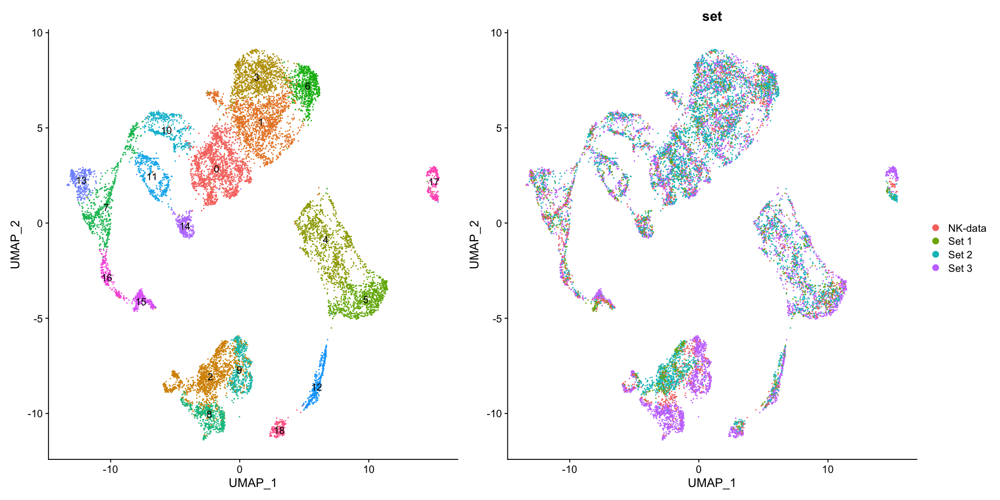

In [13]:
options(repr.plot.width=16, repr.plot.height=8)
seu_HQC <- RunPCA(seu_HQC)
seu_HQC <- RunUMAP(seu_HQC, dims = 1:30, n.neighbors = 20L)
seu_HQC <- FindNeighbors(seu_HQC, dims = 1:30)
seu_HQC <- FindClusters(seu_HQC)
p <- DimPlot(seu_HQC, reduction = 'umap', label = T) + NoLegend() + DimPlot(seu_HQC, reduction = 'umap', group.by = 'set')
plot(p)

Datasets were not be mixed in UMAP plot

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 13467
Number of edges: 443822

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8900
Number of communities: 22
Elapsed time: 2 seconds


Saving 7 x 7 in image



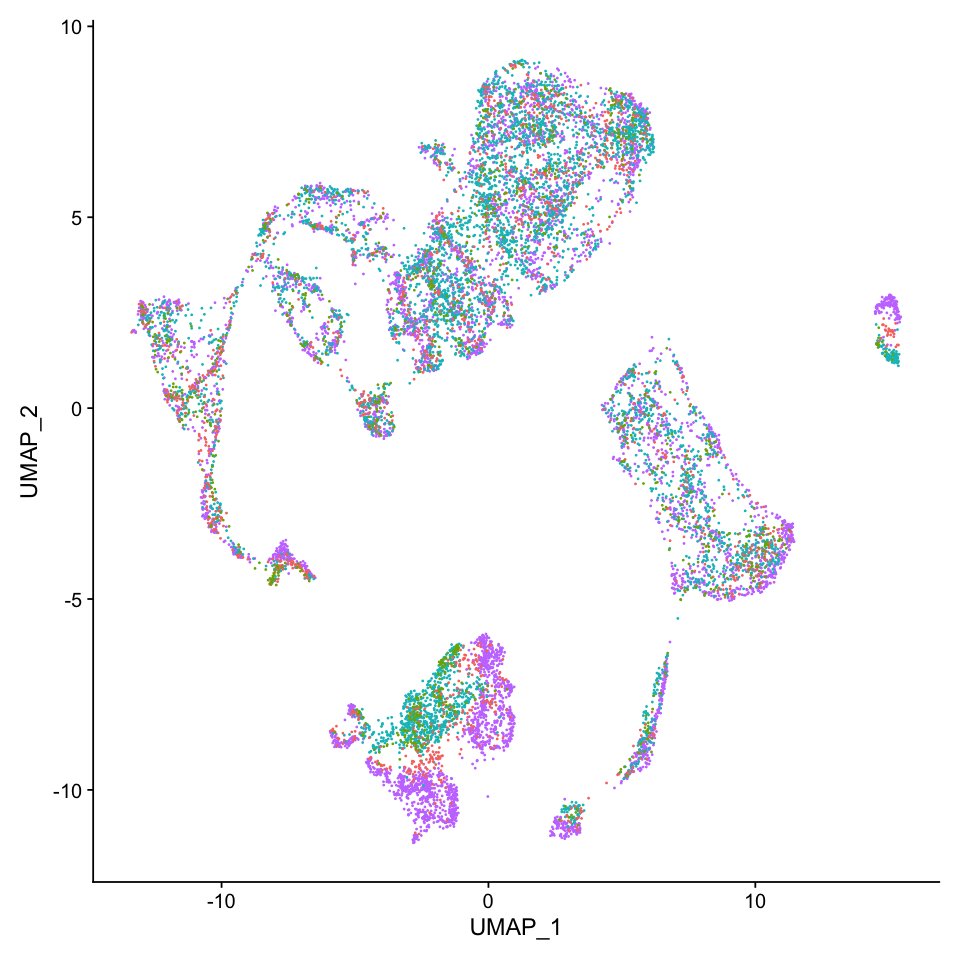

In [14]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC <- FindClusters(seu_HQC, resolution = 0.9) #the same resolution as Set3_CAP
fig <- DimPlot(seu_HQC, reduction = 'umap', group.by = 'set') + NoLegend() + theme(plot.title = element_blank())
plot(fig)
ggsave(fig, file = "./figures/01_integrated_all_Harmony/Naive_results_All_Set.eps", dpi = 300)

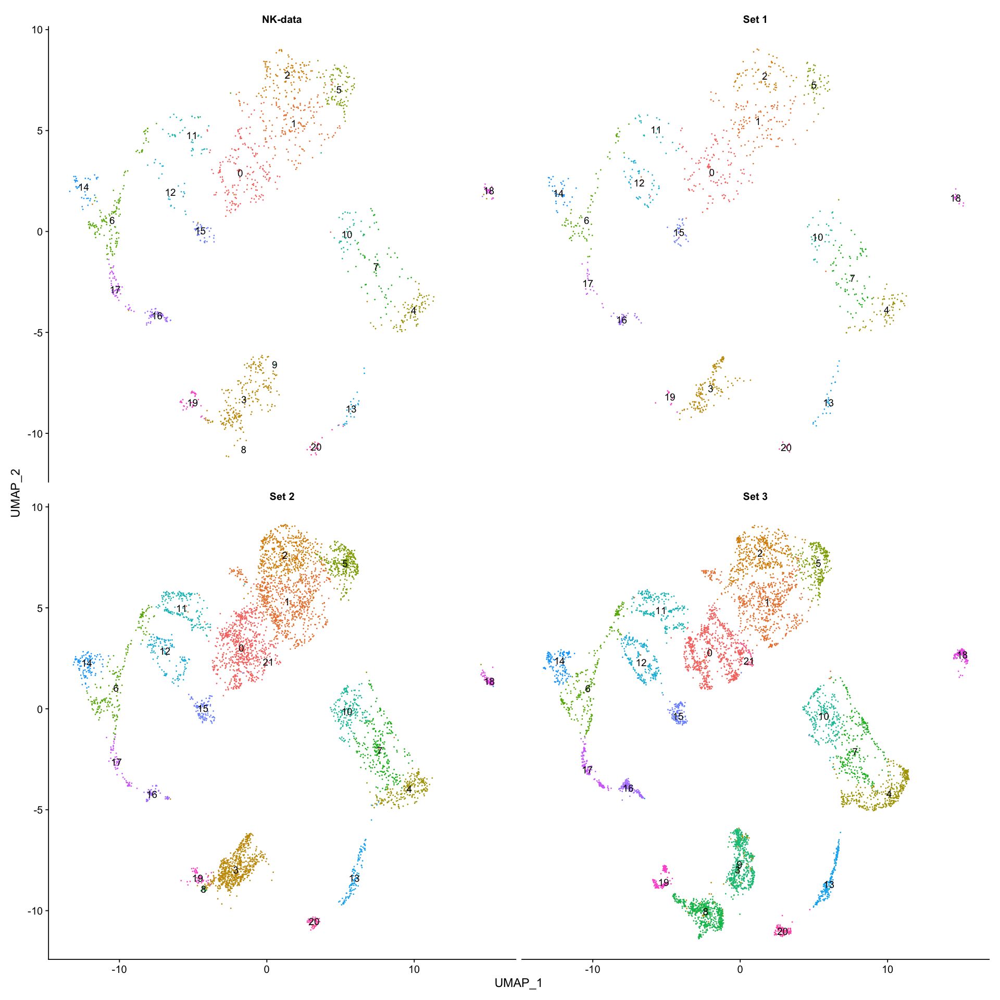

In [15]:
options(repr.plot.width=16, repr.plot.height=16)
DimPlot(seu_HQC, reduction = 'umap', label = T, split.by = 'set', ncol = 2) + NoLegend()

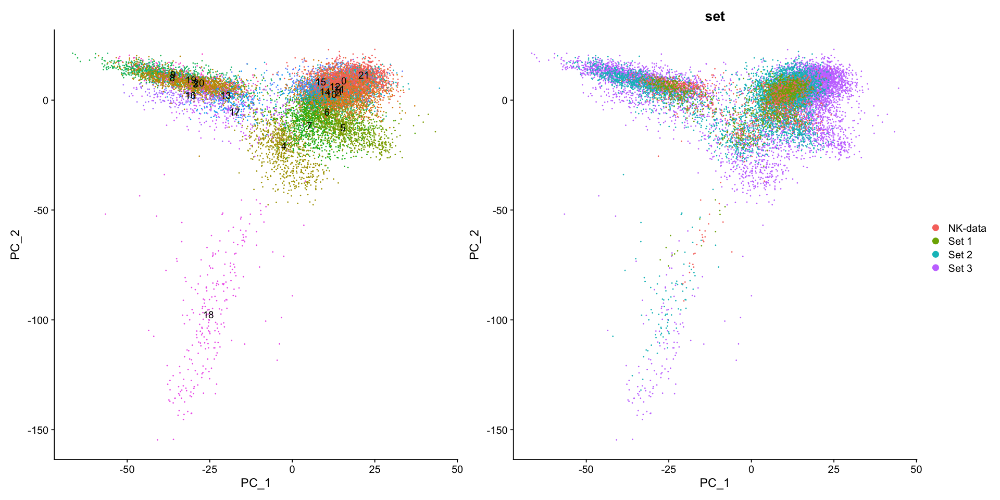

In [16]:
options(repr.plot.width=16, repr.plot.height=8)
p <- DimPlot(seu_HQC, reduction = 'pca', label = T) + NoLegend() + DimPlot(seu_HQC, reduction = 'pca', group.by = 'set')
plot(p)

### Using Harmony

PC_ 1 
Positive:  CG13427, SoxN, Lac, CG34224, CG10035, ImpL2, sog, Dl, aop, ths 
	   CG15628, Atx-1, hth, cv-2, ASPP, E(spl)m4-BFM, blot, Brd, Tet, Tom 
	   crb, sca, Ptr, CG13217, sdt, grh, CG5059, CG15480, Meltrin, Antp 
Negative:  twi, Ilp4, hll, CadN, zfh1, Cyp310a1, sprt, htl, tin, VepD 
	   sna, Mef2, Mes2, CG12177, CG3036, Act87E, CG14688, stumps, Pka-C3, SNCF 
	   Ama, stg, Mdr49, NetA, Nplp2, CG43355-sala, sty, wntD, CG11357, CG1673 
PC_ 2 
Positive:  SoxN, Ilp4, twi, ImpL2, sog, CG43355-sala, trn, Toll-6, hth, sca 
	   CadN, hll, ths, stg, sprt, slp1, Tollo, tin, htl, Cyp310a1 
	   wntD, D, tsh, HmgD, robo2, Mef2, Antp, mid, Ubx, pri 
Negative:  peb, fkh, Doc1, pgc, nos, BigH1, stai, Eno, Tao, dap 
	   26-29-p, p23, fabp-sea, Doc3, shu, wisp, ovo, CycB, ps, egr 
	   Hsp83, PyK, bru1, cib, srp, pum, Jafrac1, del, spz, zpg 
PC_ 3 
Positive:  SoxN, sog, sca, ths, ImpL2, D, Toll-6, Tet, Tollo, brk 
	   Meltrin, gsb, Pino, Dl, slp1, Hsp83, CG17724-Kdm4B-seq, nos, lok, stai 
	   B

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 13467
Number of edges: 523135

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9069
Number of communities: 21
Elapsed time: 2 seconds


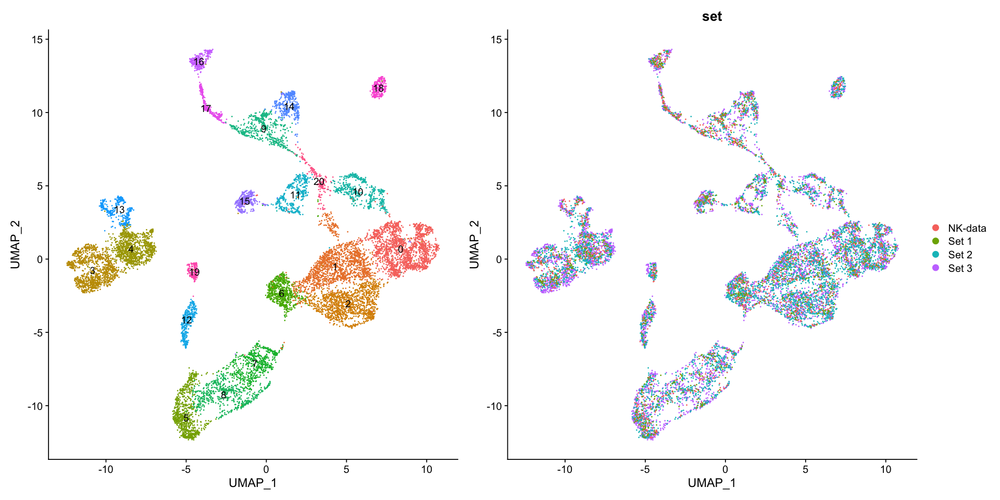

In [17]:
options(repr.plot.width=16, repr.plot.height=8)
seu_HQC <- RunPCA(seu_HQC)
seu_HQC <- RunHarmony(seu_HQC, group.by.vars = 'set',assay.use="SCT")
seu_HQC <- RunUMAP(seu_HQC, dims = 1:30, n.neighbors = 20L, reduction = 'harmony')
seu_HQC <- FindNeighbors(seu_HQC, dims = 1:30,reduction = 'harmony')
seu_HQC <- FindClusters(seu_HQC)
p <- DimPlot(seu_HQC, reduction = 'umap', label = T) + NoLegend() + DimPlot(seu_HQC, reduction = 'umap', group.by = 'set')
plot(p)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 13467
Number of edges: 523135

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9007
Number of communities: 22
Elapsed time: 1 seconds


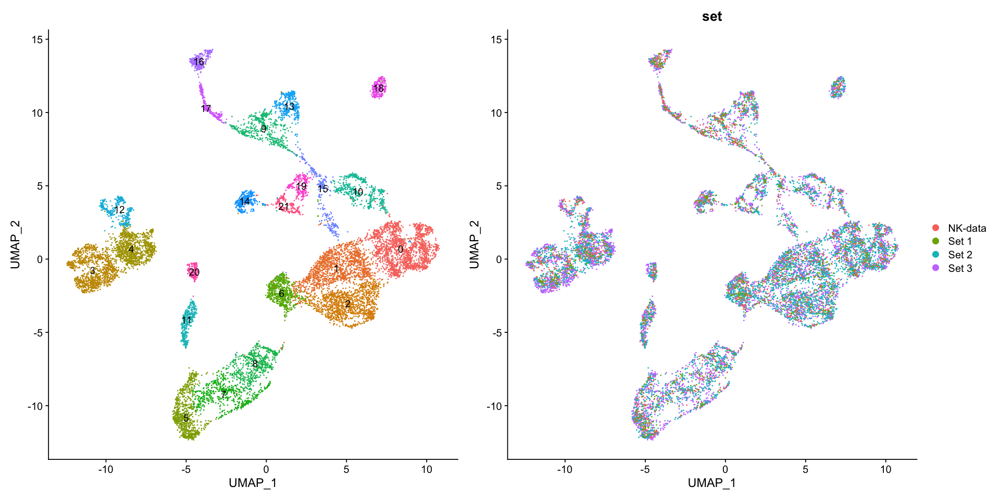

In [18]:
options(repr.plot.width=16, repr.plot.height=8)
seu_HQC <- FindClusters(seu_HQC, resolution = 0.9) #the same resolution as Set3_CAP
p <- DimPlot(seu_HQC, reduction = 'umap', label = T) + NoLegend() + DimPlot(seu_HQC, reduction = 'umap', group.by = 'set')
plot(p)

All datasets were mixed

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 13467
Number of edges: 523135

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9007
Number of communities: 22
Elapsed time: 1 seconds


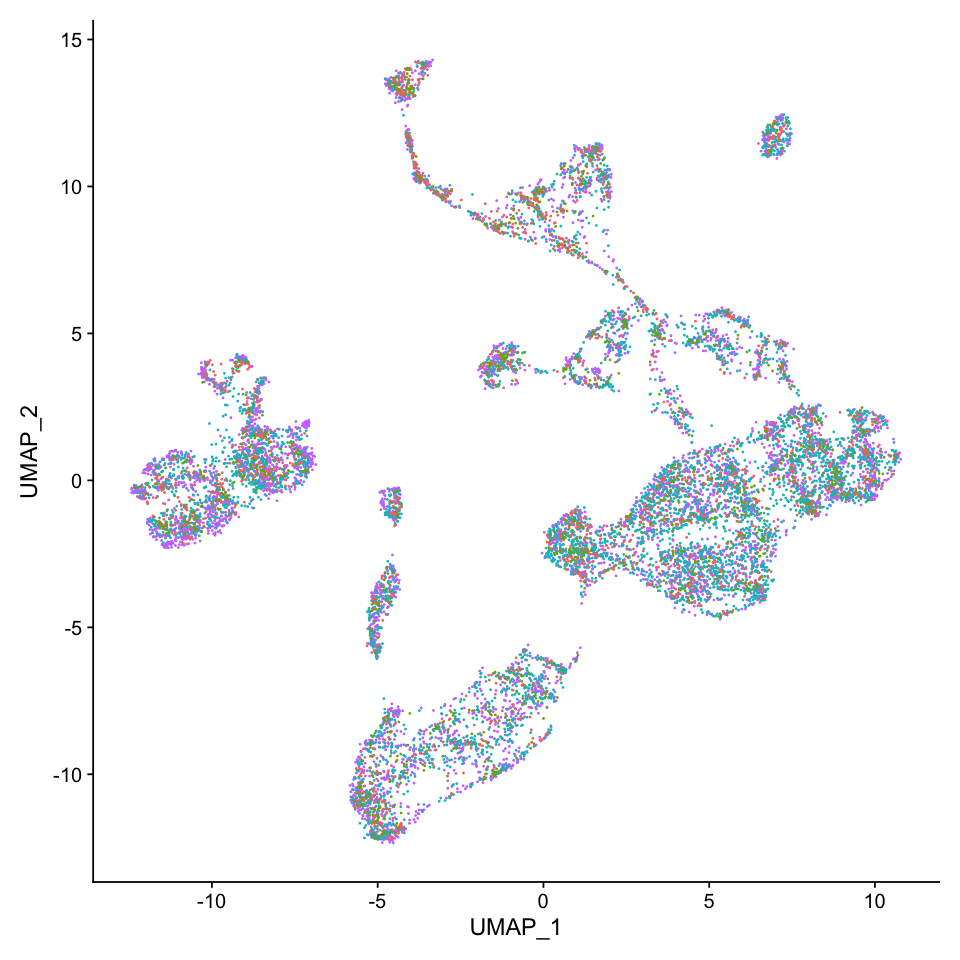

Saving 7 x 7 in image



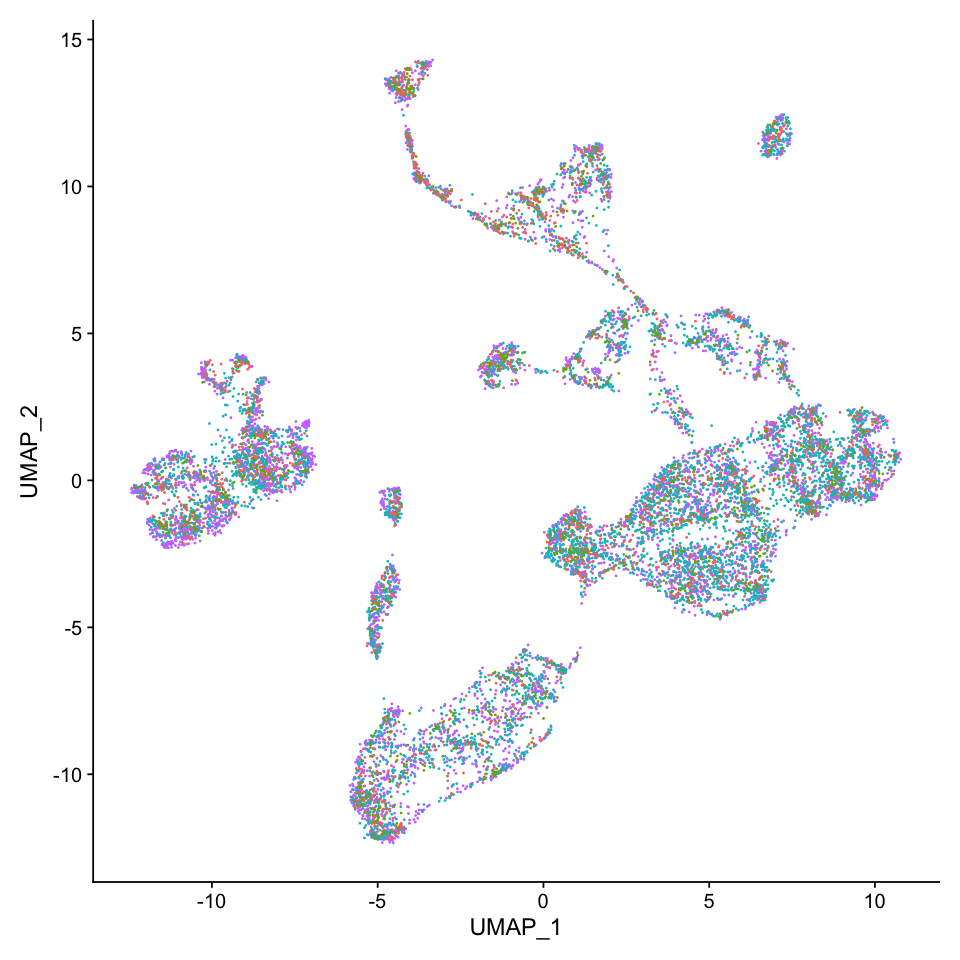

In [19]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC <- FindClusters(seu_HQC, resolution = 0.9) #the same resolution as Set3_CAP
fig <- DimPlot(seu_HQC, reduction = 'umap', group.by = 'set') + NoLegend() + theme(plot.title = element_blank())
plot(fig)
plot(fig)
ggsave(fig, file = "./figures/01_integrated_all_Harmony/Harmony_results_All_Set.eps", dpi = 300)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 13467
Number of edges: 523135

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9007
Number of communities: 22
Elapsed time: 1 seconds


Saving 7 x 7 in image



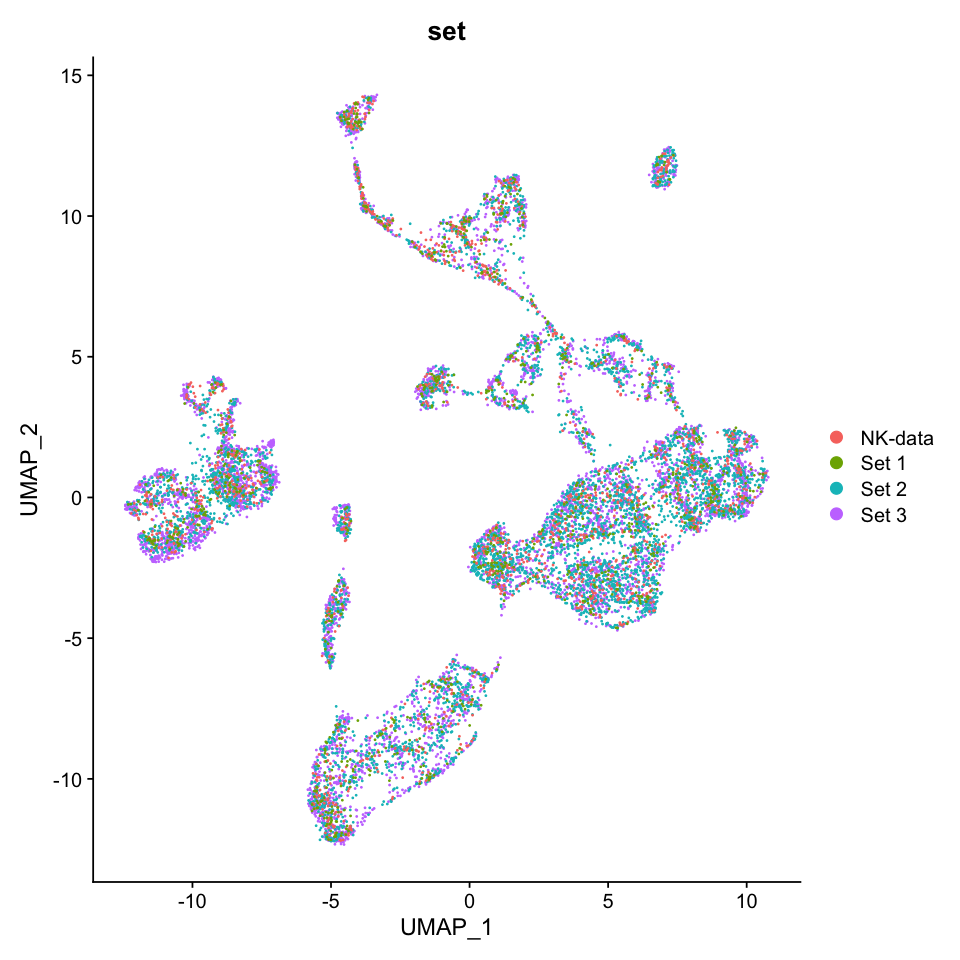

In [21]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC <- FindClusters(seu_HQC, resolution = 0.9) #the same resolution as Set3_CAP
fig <- DimPlot(seu_HQC, reduction = 'umap', group.by = 'set')
plot(fig)
ggsave(fig, file = "./figures/01_integrated_all_Harmony/Harmony_results_All_Set_with_legend.eps", dpi = 300)

Saving 7 x 7 in image



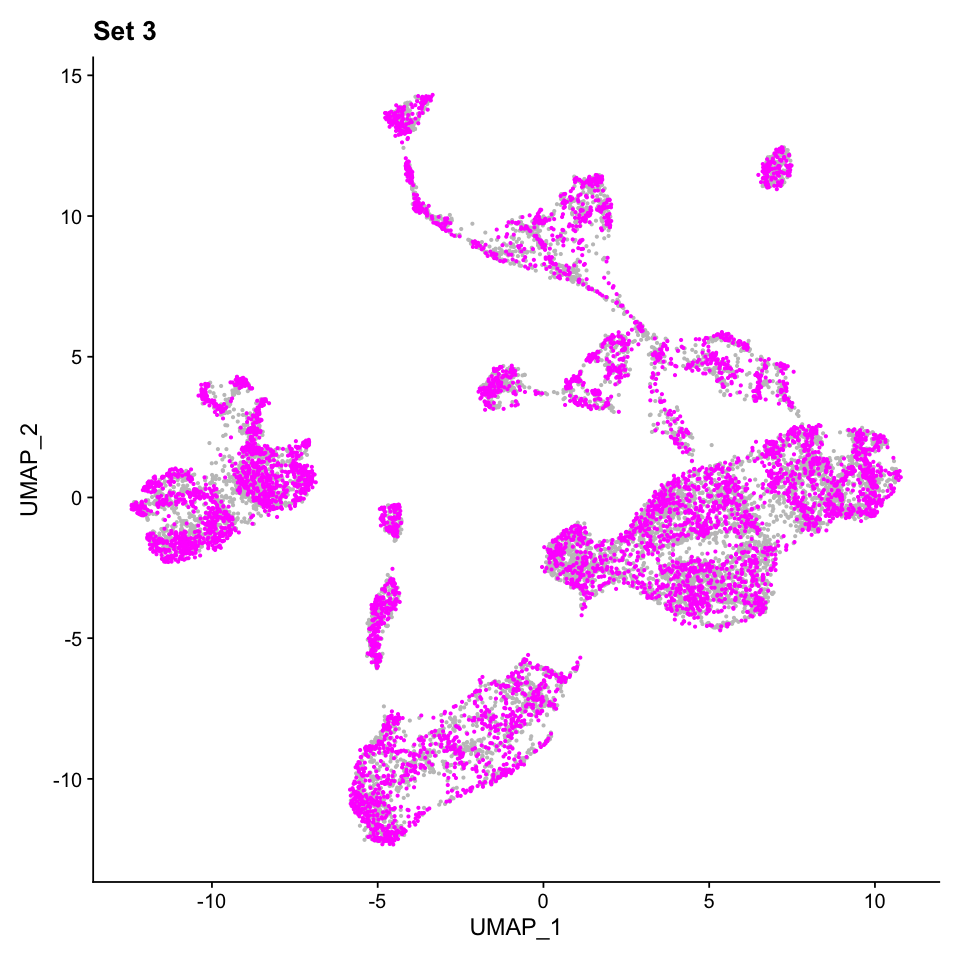

In [22]:
Idents(seu_HQC) <- 'set'
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = 'Set 3')
fig <- DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend()+ ggtitle('Set 3')
fig
ggsave(fig, file = "./figures/01_integrated_all_Harmony/Harmony_results_highlight_Set3.eps", dpi = 300)

Saving 7 x 7 in image



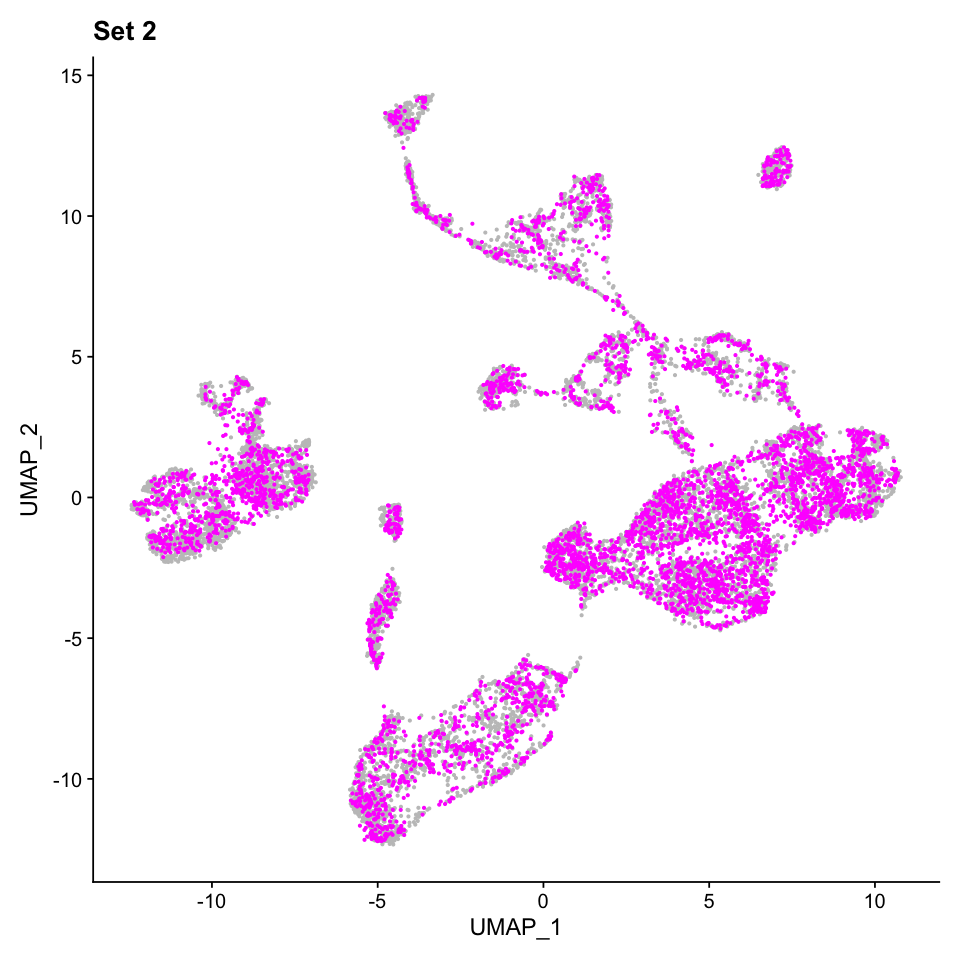

In [23]:
Idents(seu_HQC) <- 'set'
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = 'Set 2')
fig <- DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend()+ ggtitle('Set 2')
fig
ggsave(fig, file = "./figures/01_integrated_all_Harmony/Harmony_results_highlight_Set2.eps", dpi = 300)

Saving 7 x 7 in image



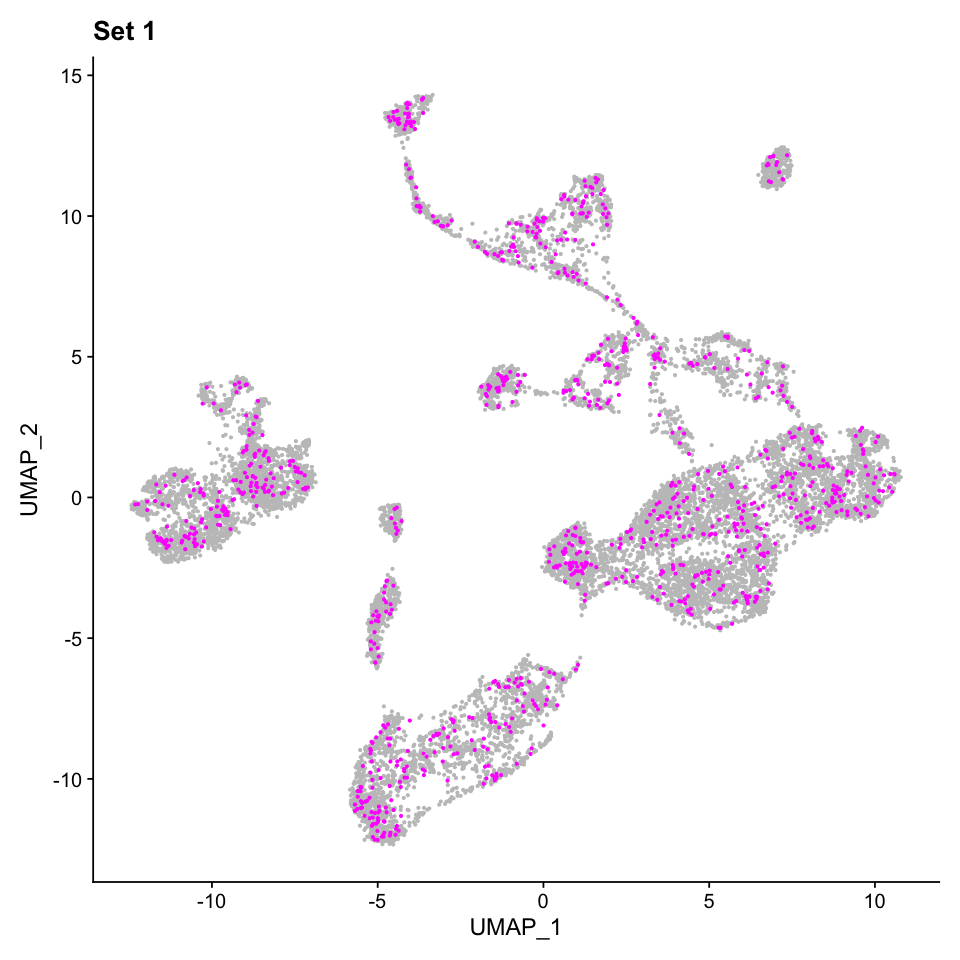

In [24]:
Idents(seu_HQC) <- 'set'
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = 'Set 1')
fig <- DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend()+ ggtitle('Set 1')
fig
ggsave(fig, file = "./figures/01_integrated_all_Harmony/Harmony_results_highlight_Set1.eps", dpi = 300)

Saving 7 x 7 in image



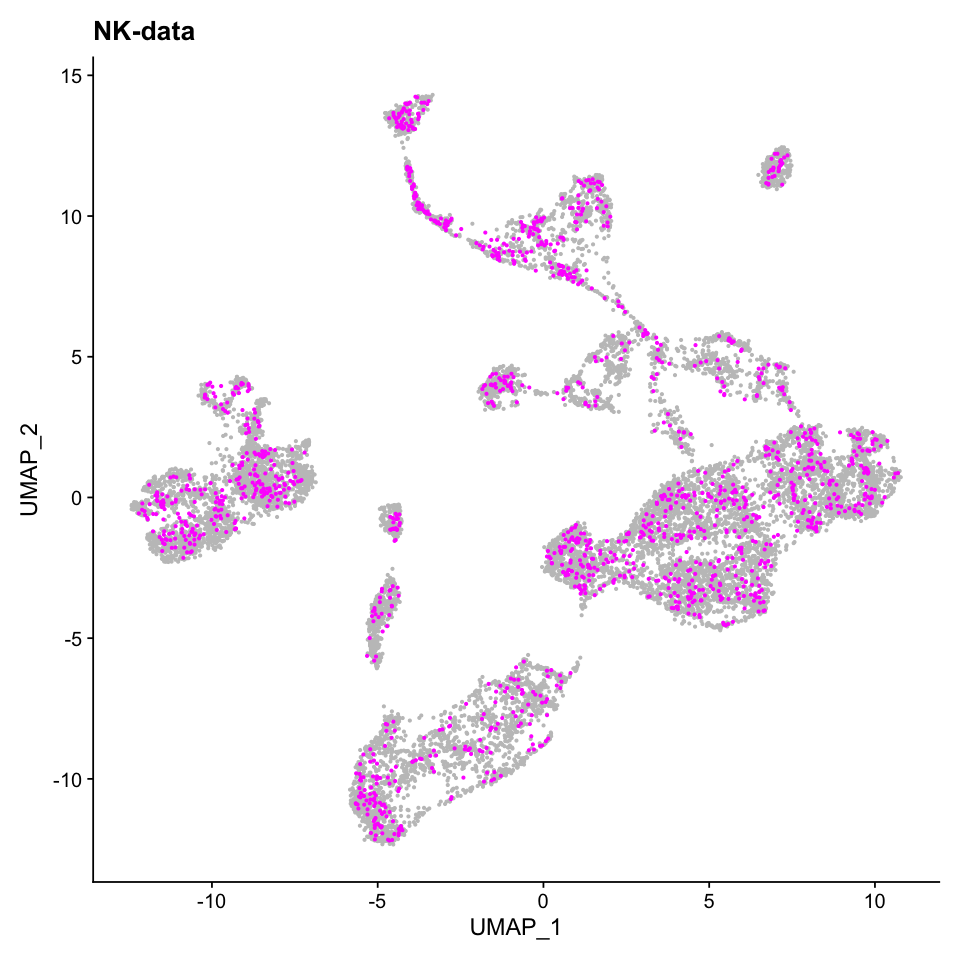

In [25]:
Idents(seu_HQC) <- 'set'
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = 'NK-data')
fig <- DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend()+ ggtitle('NK-data')
fig
ggsave(fig, file = "./figures/01_integrated_all_Harmony/Harmony_results_highlight_NKdata.eps", dpi = 300)

## Check marker genes

In [26]:
Idents(seu_HQC) <- 'seurat_clusters'
all.markers <- FindAllMarkers(object = seu_HQC, only.pos = TRUE)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 20

Calculating cluster 21



Warning message in DoHeatmap(seu_HQC, features = all.markers.top10$gene):
“The following features were omitted as they were not found in the scale.data slot for the SCT assay: Pepck-CG45087”


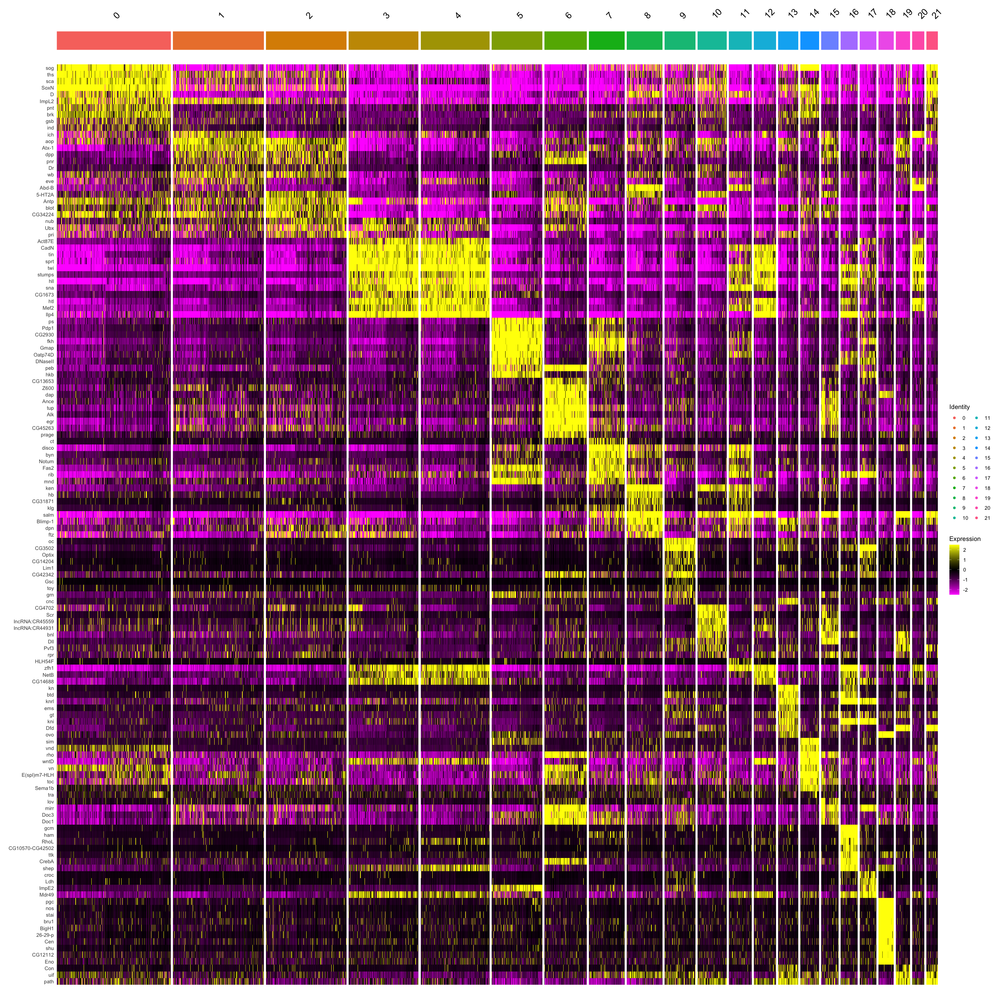

In [27]:
options(repr.plot.width=24, repr.plot.height=24)
DoHeatmap(seu_HQC, features = all.markers.top10$gene)

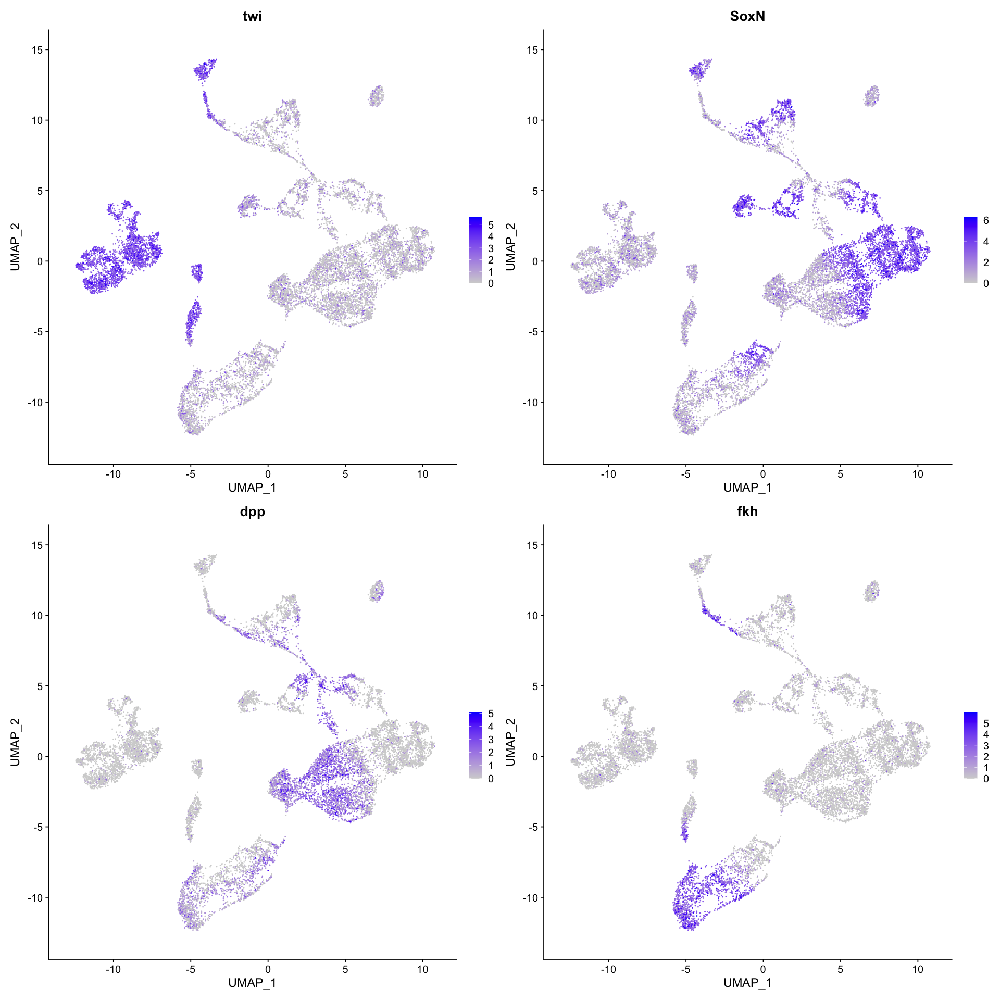

In [28]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, features = c('twi','SoxN','dpp','fkh'))

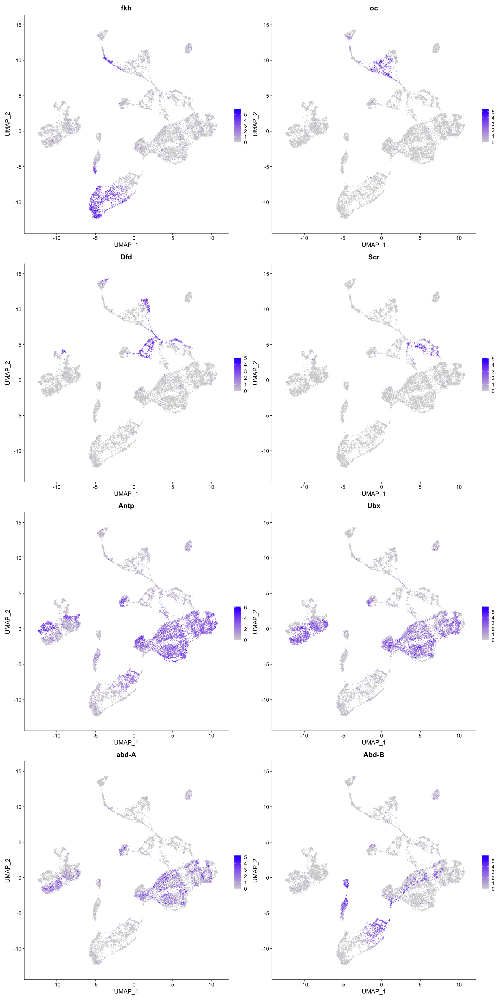

In [29]:
options(repr.plot.width=16, repr.plot.height=32)
FeaturePlot(seu_HQC, features = c('fkh','oc','Dfd','Scr','Antp','Ubx','abd-A','Abd-B'), ncol = 2)

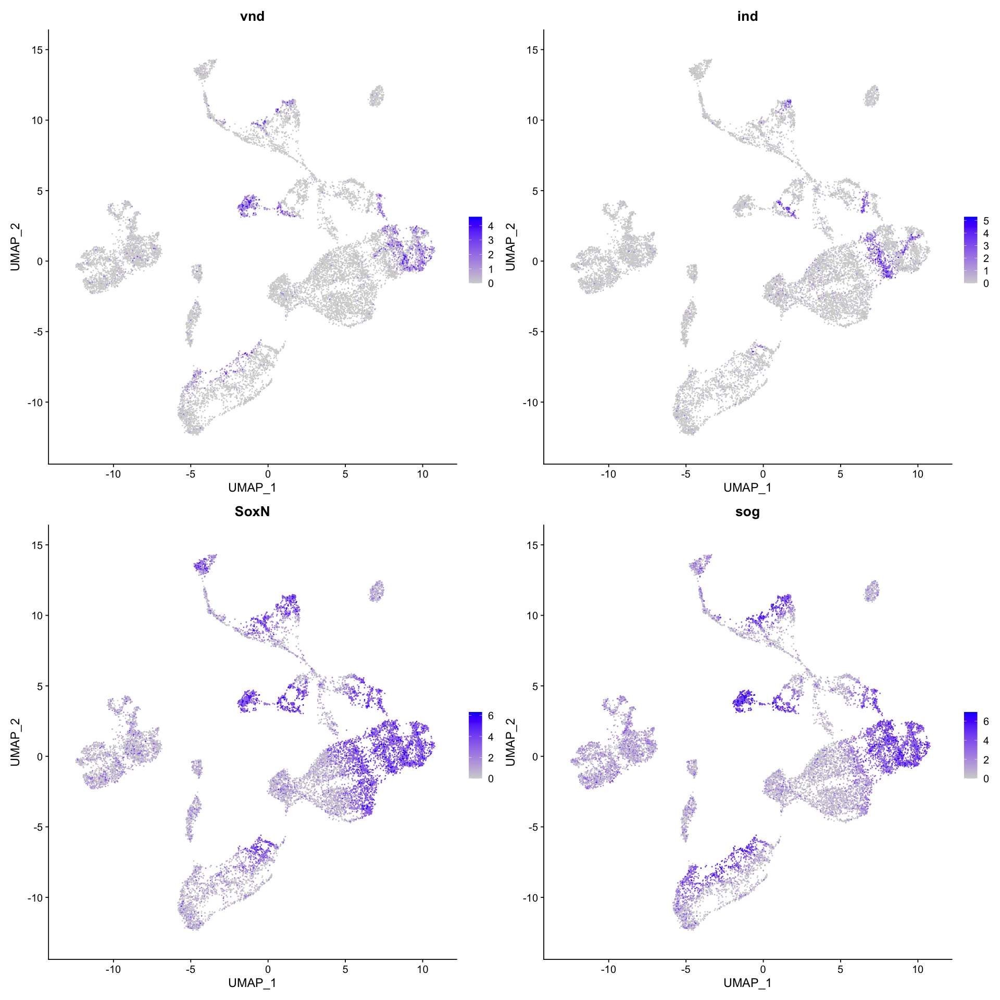

In [30]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, features = c('vnd','ind','SoxN','sog'))

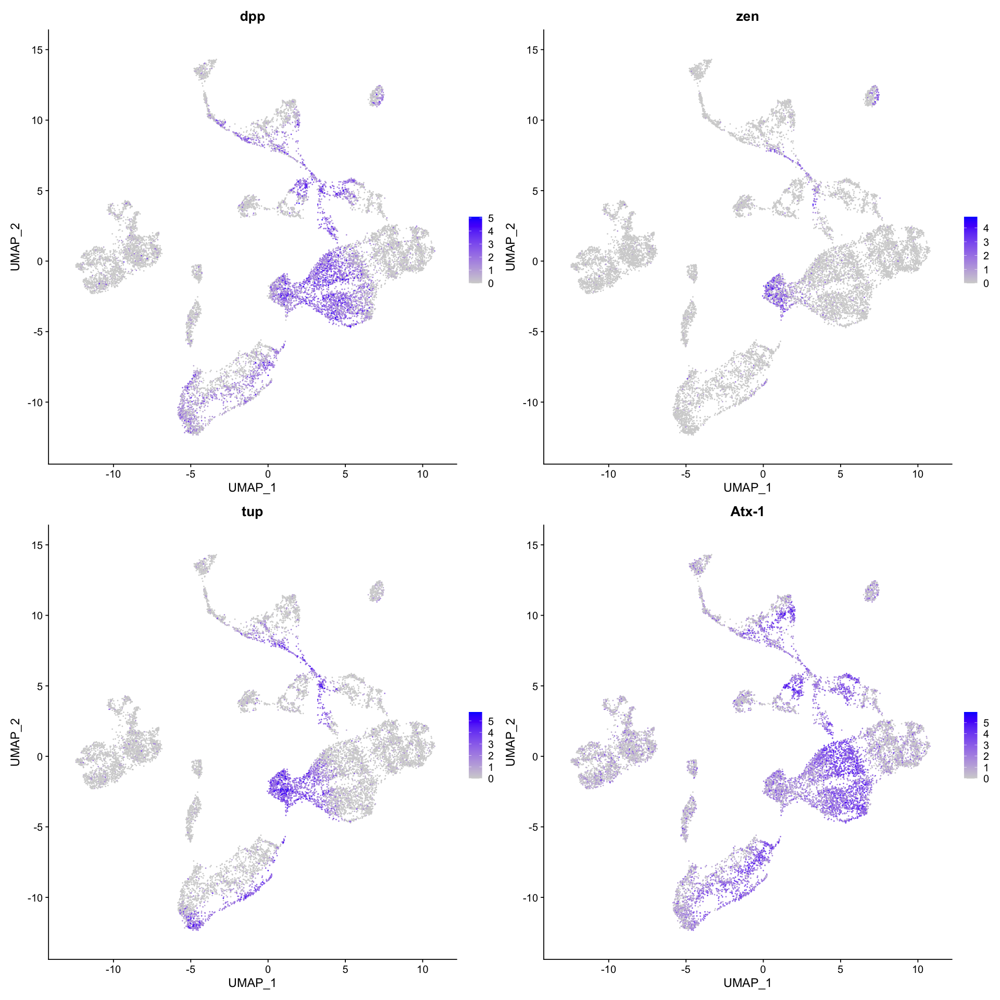

In [31]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, features = c('dpp','zen','tup','Atx-1'))

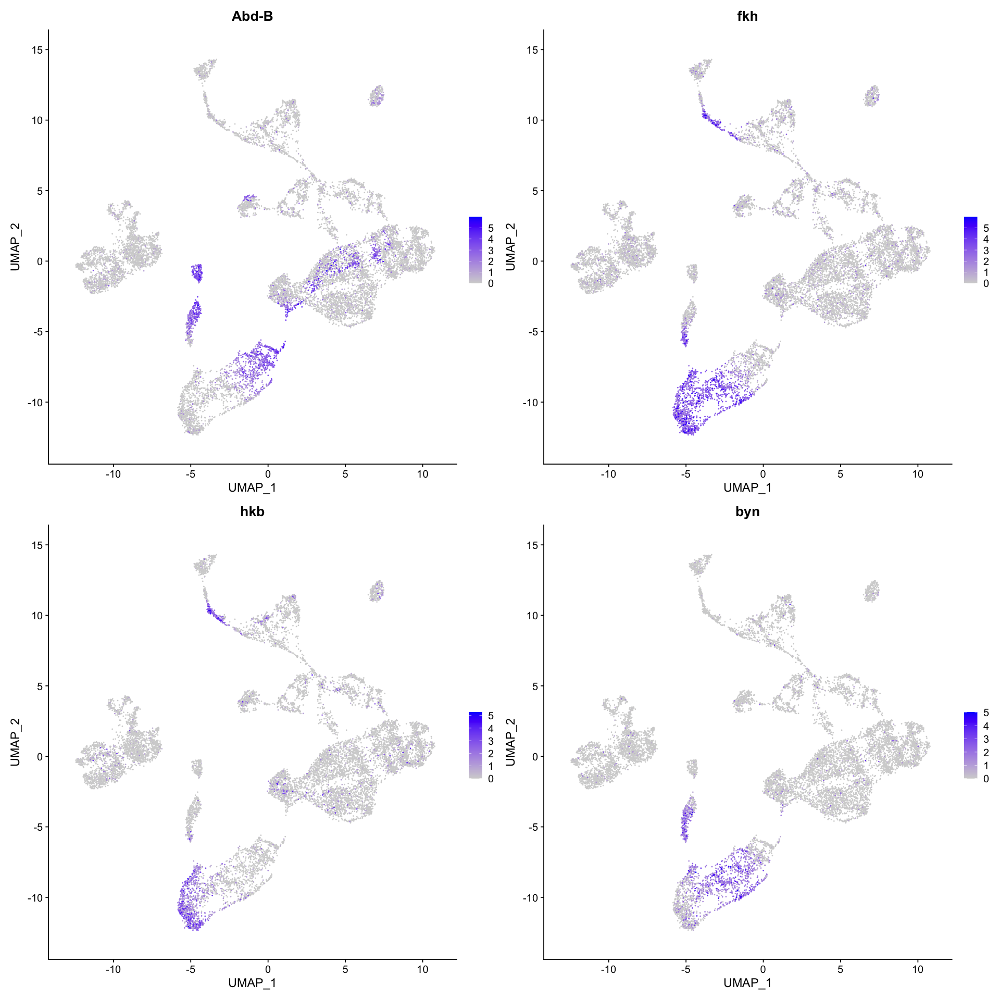

In [32]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, features = c('Abd-B','fkh','hkb','byn'))

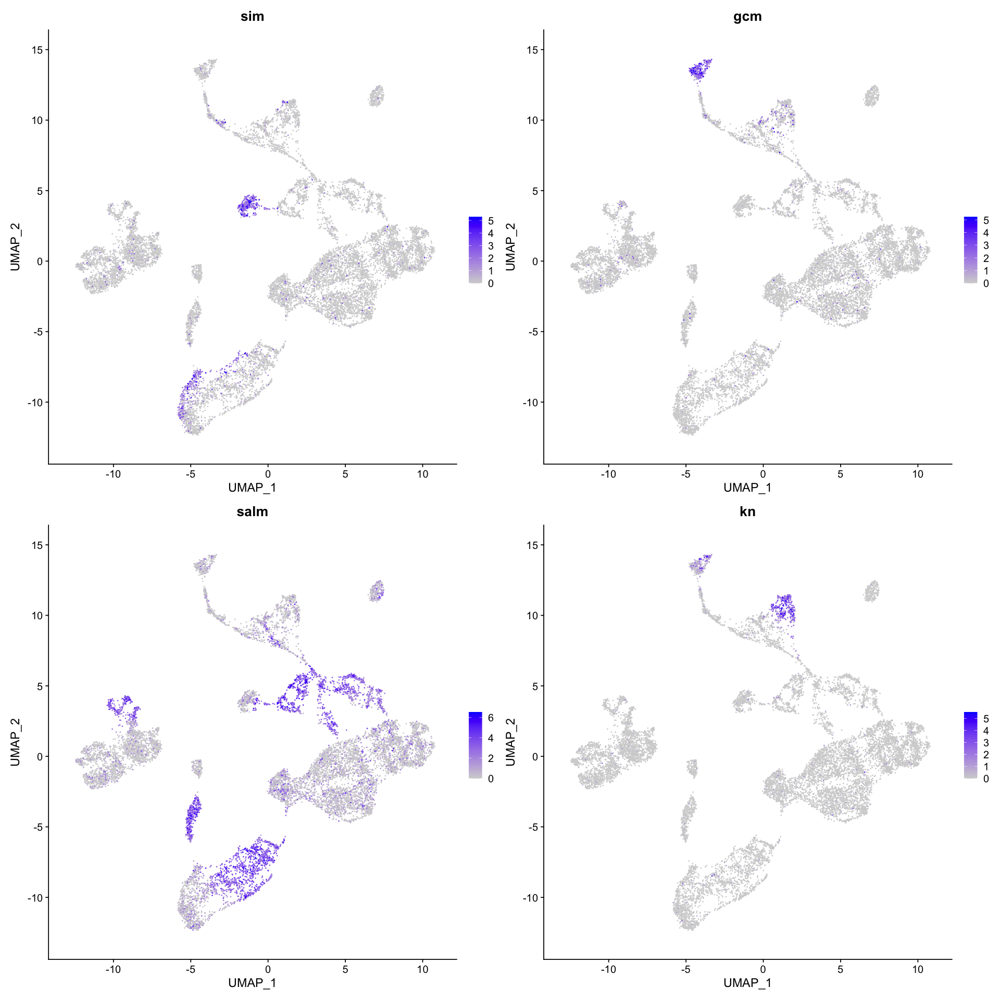

In [33]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, features = c('sim','gcm','salm','kn'))

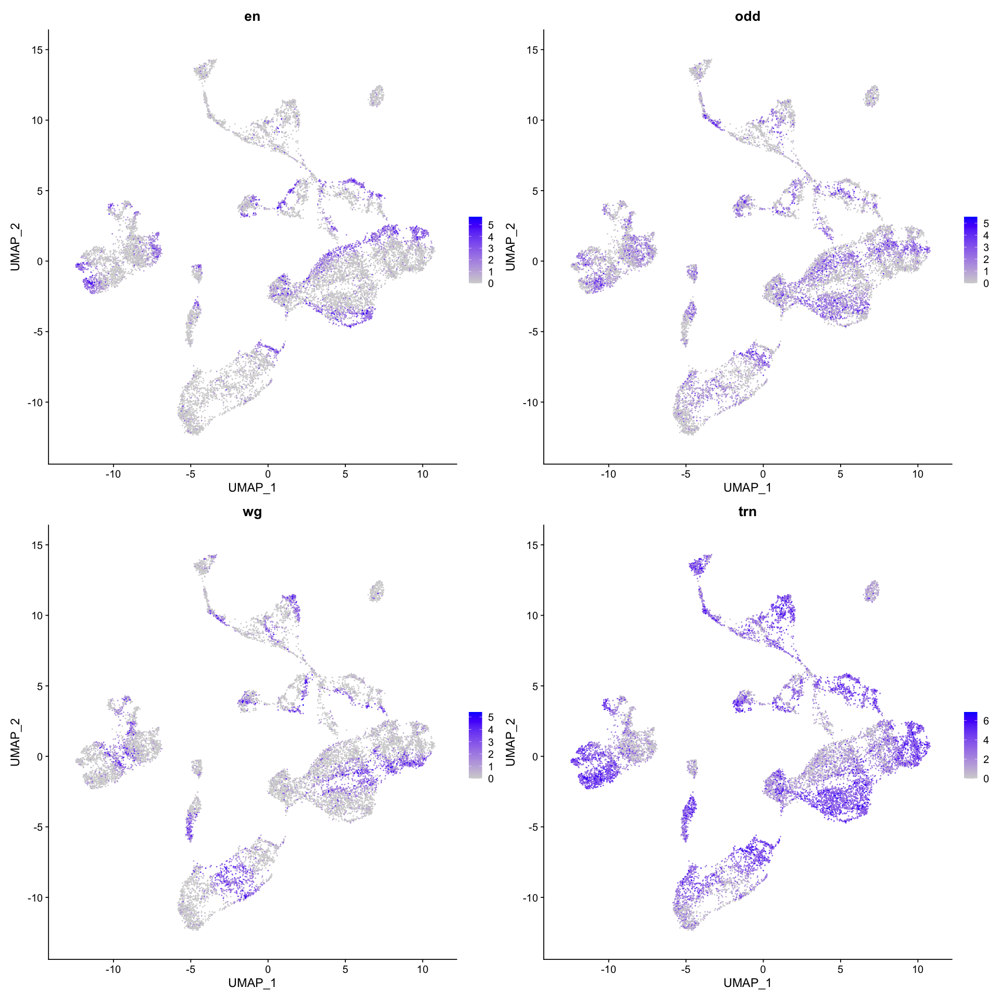

In [34]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, features = c('en','odd','wg','trn'))

In [35]:
write.csv(all.markers, file = 'all_markers_seurat_clusters.csv')

## Cluster Annotation

,manual_ID
,<fct>
Set3_AAAGAACGTGTTCGTA,17
Set3_AACACACTCGTGGAAG,17
Set3_AACCTTTCACCCTCTA,17
Set3_AATGCCAAGTCAGGGT,17
Set3_ACACAGTAGAAGGATG,17
Set3_ACAGCCGGTTAGGCTT,17


,manual_ID
,<fct>
Set3_AAAGAACGTGTTCGTA,Head_mesoderm/Anterior_midgut
Set3_AACACACTCGTGGAAG,Head_mesoderm/Anterior_midgut
Set3_AACCTTTCACCCTCTA,Head_mesoderm/Anterior_midgut
Set3_AATGCCAAGTCAGGGT,Head_mesoderm/Anterior_midgut
Set3_ACACAGTAGAAGGATG,Head_mesoderm/Anterior_midgut
Set3_ACAGCCGGTTAGGCTT,Head_mesoderm/Anterior_midgut


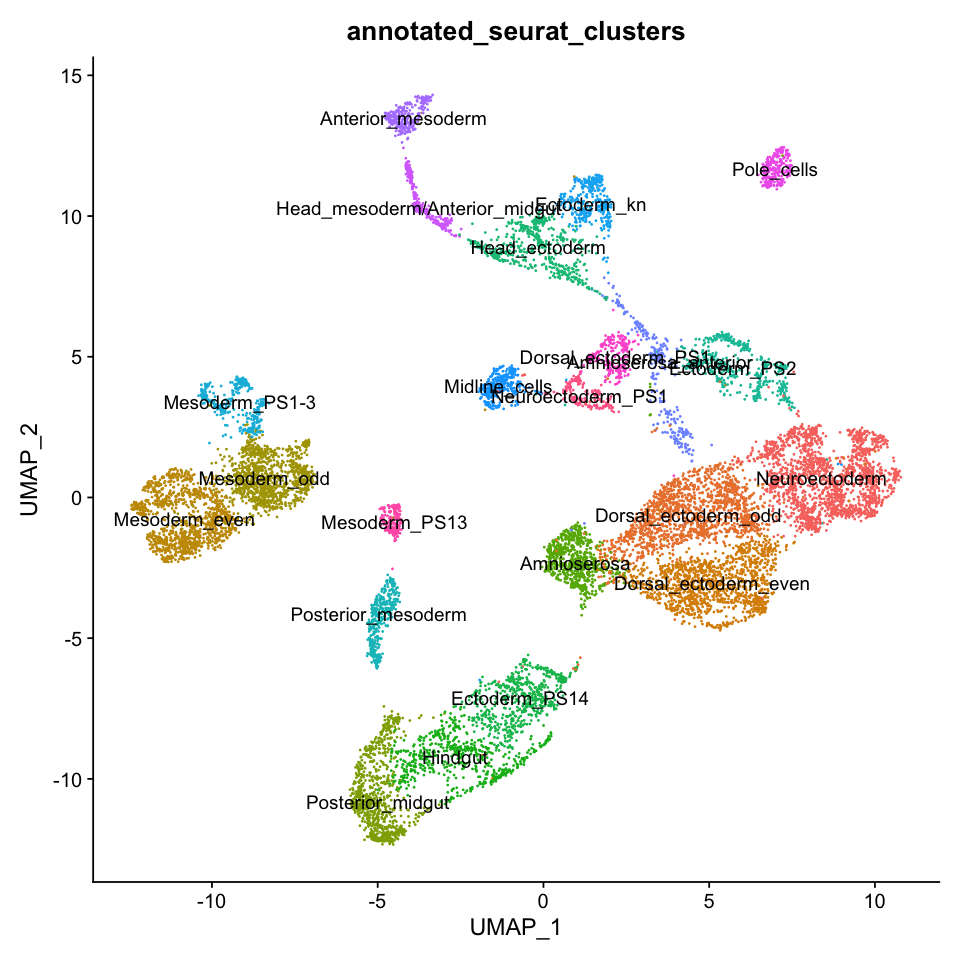

In [36]:
manual_id <- as.data.frame(seu_HQC$seurat_clusters)
colnames(manual_id) <- c('manual_ID')
head(manual_id)
manual_id$manual_ID = dplyr::recode(manual_id$manual_ID, 
                                     "0"="Neuroectoderm", 
                                     "1"="Dorsal_ectoderm_odd",
                                     "2"="Dorsal_ectoderm_even",
                                     "3"="Mesoderm_even",
                                     "4"="Mesoderm_odd",
                                     "5"="Posterior_midgut",
                                     "6"="Amnioserosa",
                                     "7"="Hindgut",
                                     "8"="Ectoderm_PS14",
                                     "9"="Head_ectoderm",
                                     "10"="Ectoderm_PS2",
                                     "11"="Posterior_mesoderm",
                                     "12"="Mesoderm_PS1-3",
                                     "13"="Ectoderm_kn",
                                     "14"="Midline_cells",
                                     "15"="Amnioserosa_anterior",
                                     "16"="Anterior_mesoderm",
                                     "17"="Head_mesoderm/Anterior_midgut",
                                     "18"="Pole_cells",
                                     "19"="Dorsal_ectoderm_PS1",
                                     "20"="Mesoderm_PS13",
                                     "21"="Neuroectoderm_PS1")
                                    

head(manual_id)
seu_HQC$annotated_seurat_clusters <- manual_id
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC, reduction = 'umap', label = T, group.by = 'annotated_seurat_clusters') + NoLegend() 

In [37]:
saveRDS(object = seu_HQC, '../../data/seurat_object/all_integration/seu_Harmony_integrated.obj')

In [38]:
levels <- read.table(file="./seurat_clusters_rename_levels_color_integration.txt")
colors <- levels[,2]
levels <- levels[,1]
head(levels)
length(levels)
head(colors)

[1] "Head_ectoderm"        "Ectoderm_kn"          "Dorsal_ectoderm_PS1" 
[4] "Neuroectoderm_PS1"    "Ectoderm_PS2"         "Amnioserosa_anterior"

[1] 22

[1] "skyblue1"  "skyblue2"  "skyblue3"  "slateblue" "skyblue4"  "gray85"

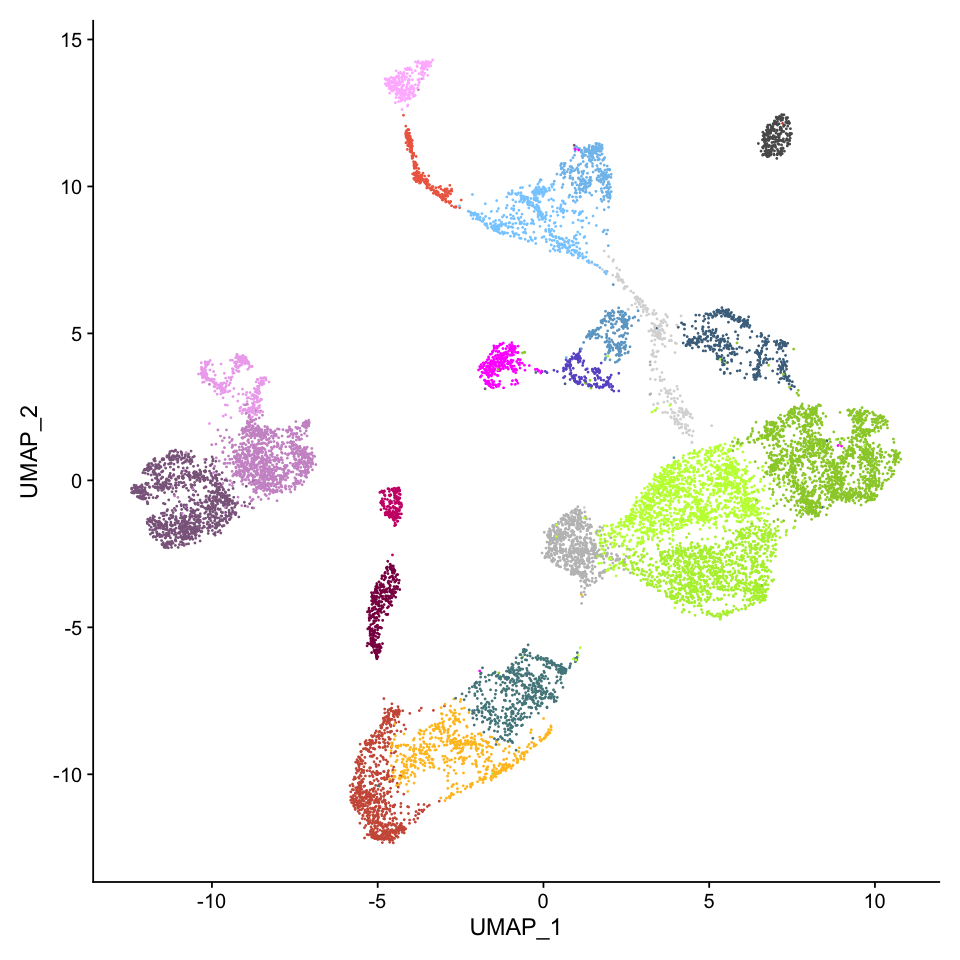

In [39]:
Idents(seu_HQC) <- 'annotated_seurat_clusters'
levels(seu_HQC) <- levels
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC, reduction =  "umap", label = FALSE, cols = colors) + NoLegend() 
fig
ggsave(fig, file = "./figures/01_integrated_all_Harmony/all_cells_umap_seurat_clusters_integration.eps", dpi = 300, width =8, height = 8)

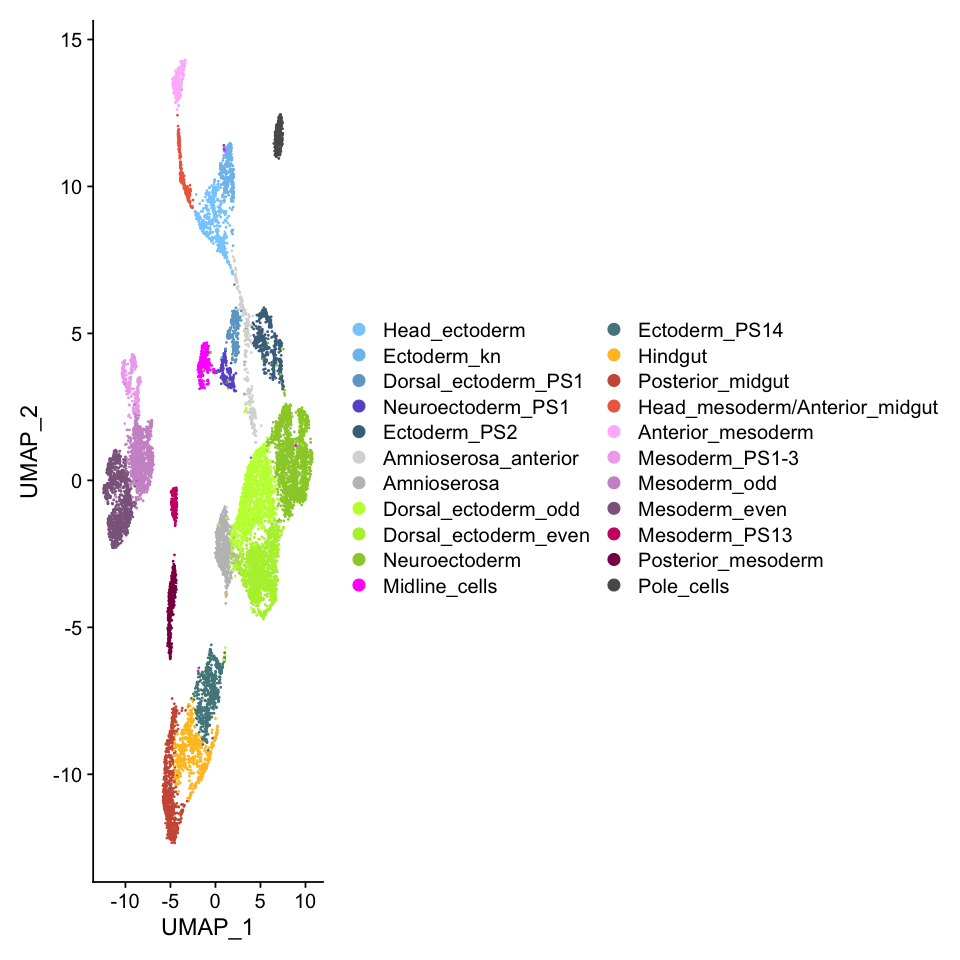

In [40]:
Idents(seu_HQC) <- 'annotated_seurat_clusters'
levels(seu_HQC) <- levels
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC, reduction =  "umap", label = FALSE, cols = colors)
fig
ggsave(fig, file = "./figures/01_integrated_all_Harmony/all_cells_umap2_seurat_clusters_integration.eps", dpi = 300, width =20, height = 8)

In [41]:
path = './figures/gene_expressions_on_UMAP'
features <- c("sna", "twi","CadN",
              "SoxN","dpp",
              "fkh","hkb","srp",
              "sim","E(spl)m8-HLH","gcm", "byn", "ct", "disco",
              "sog", "vnd", "ind", "Dr","Atx-1", "tup", "grn", "Doc2", "zen","peb",
              "trn","eve","ftz","en","wg",
              "Optix", "oc", "kn","Dll","salm","Dfd","Scr", "Antp", "Ubx", "abd-A","Abd-B")
for (name in features){
    options(repr.plot.width=8, repr.plot.height=8)
    p <- FeaturePlot(seu_HQC, features = name) + theme(plot.title = element_blank())
    basename = paste(name, 'integration_all_cells.eps',sep = '_')
    filename = paste(path, basename, sep = '/')
    ggsave(p, file = filename, width = 8, height = 8)
}

In [43]:
path = './figures/gene_expressions_on_UMAP'
features <- c("sna", "twi","CadN",
              "SoxN","dpp",
              "fkh","hkb","srp",
              "sim","E(spl)m8-HLH","gcm", "byn", "ct", "disco",
              "sog", "vnd", "ind", "Dr","Atx-1", "tup", "grn", "Doc2", "zen","peb",
              "trn","eve","ftz","en","wg",
              "Optix", "oc", "kn","Dll","salm","Dfd","Scr", "Antp", "Ubx", "abd-A","Abd-B")
for (name in features){
    options(repr.plot.width=8, repr.plot.height=8)
    p <- FeaturePlot(seu_HQC, features = name) + NoLegend() + theme(plot.title = element_blank())
    basename = paste(name, 'integration_all_cells_wo_scalebar.eps',sep = '_')
    filename = paste(path, basename, sep = '/')
    ggsave(p, file = filename, width = 8, height = 8)
}

In [44]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRblas.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRlapack.dylib

locale:
[1] ja_JP.UTF-8/ja_JP.UTF-8/ja_JP.UTF-8/C/ja_JP.UTF-8/ja_JP.UTF-8

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] harmony_0.1.0     Rcpp_1.0.7        tibble_3.0.5      dplyr_1.0.3      
[5] Matrix_1.3-2      data.table_1.13.6 magrittr_2.0.1    ggplot2_3.3.3    
[9] Seurat_3.2.3     

loaded via a namespace (and not attached):
  [1] nlme_3.1-151          matrixStats_0.57.0    RcppAnnoy_0.0.18     
  [4] RColorBrewer_1.1-2    httr_1.4.2            repr_1.1.0           
  [7] sctransform_0.3.2     tools_4.0.3           R6_2.5.1             
 [10] irlba_2.3.3           rpart_4.1-15          KernSmooth_2.2